<a href="https://colab.research.google.com/github/IA1819/tutorial-notebooks-jopelle/blob/master/VentanaDeslizante_TratamientoImagenes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Notebook 2: Detección de objetos usando la aproximación tradicional


La ventana deslizante desempeña un papel importante en la detección de objetos tradicional, ya que nos permite localizar exactamente dónde se encuentra el objeto en una imagen. Utilizando una ventana deslizante y una pirámide de imágenes podremos detectar objetos. Esto es lo que vamos hacer en este notebook, contamos con un clasificador (previamente entrenado) que nos dirá la clase del objeto y utilizaremos la ventana deslizante para en cada ventana hacer una predicción.

## Pasos previos

El primer paso de todos será cargar las librerías y paquetes necesarios, en este caso con las que más vamos a trabajar son:
* Numpy es una extensión de Python, que le permite realizar operaciones con vectores y matrices.
* Cv2 es OpenCV una biblioteca libre de visión artificial.
* Matpltolib es una biblioteca para la generación de gráficos a partir de datos.
* Imutils es una bilbioteca que nos permite realizar las funciones básicas de procesamiento de imágenes como la rotación, cambio de tamaño, etc.
* Keras es una biblioteca de aprendizaje profundo que utiliza por debajo TensorFlow.
* ResNet es una red profunda de 50 capas implementada en Keras y que utilizaremos para hacer la clasificación.

In [0]:
!pip install imutils
# import the necessary packages
from keras.applications import ResNet50
from keras.preprocessing.image import img_to_array
from keras.applications import imagenet_utils
from imutils.object_detection import non_max_suppression
import imutils
import numpy as np
import argparse
import time
import cv2
import matplotlib.pyplot as plt
from datetime import datetime

  Running setup.py bdist_wheel for imutils ... - done
  Stored in directory: /content/.cache/pip/wheels/cb/58/9b/7debccbc53159611f67cc7e2e3ed37b217e56e9b40e7ba80c3
Successfully built imutils


Por otro lado, a la hora de mostrar las imágenes lo normal sería utilizar la instrucción *cv2.imshow()* pero al estar trabajando sobre cuadernos de Jupyter esta instrucción no funciona bien, por lo que vamos a usar la función *mostrarImagen()* a la que le pasamos como parámetro la imagen a mostrar. 

In [0]:
def mostrarImagen(image):
    if len(image.shape)==3:
        img2 = image[:,:,::-1]
        plt.imshow(img2)
        plt.show()
    else:
        img2 = image
        plt.imshow(img2,cmap='gray')
        plt.show()

**** Descargamos las imágenes *****

In [0]:
!wget https://www.dropbox.com/s/gr9eigfoduge7sy/galaygatito.jpg?dl=0 -O galaygatito.jpg

--2018-05-28 16:16:59--  https://www.dropbox.com/s/gr9eigfoduge7sy/galaygatito.jpg?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.1, 2620:100:6021:1::a27d:4101
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.1|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://dl.dropboxusercontent.com/content_link/lD5QhcB1ujvyY8sffnp95XRhIAf069zxyrUZhM1TGnAiNUYwpNv4WZfsjqFTwtBE/file [following]
--2018-05-28 16:16:59--  https://dl.dropboxusercontent.com/content_link/lD5QhcB1ujvyY8sffnp95XRhIAf069zxyrUZhM1TGnAiNUYwpNv4WZfsjqFTwtBE/file
Resolving dl.dropboxusercontent.com (dl.dropboxusercontent.com)... 162.125.65.6, 2620:100:6021:6::a27d:4106
Connecting to dl.dropboxusercontent.com (dl.dropboxusercontent.com)|162.125.65.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64651 (63K) [image/jpeg]
Saving to: ‘galaygatito.jpg’

galaygatito.jpg     100%[===================>]  63.14K  --.-KB/s    in 0.02s   

2018-05-28 16:

## Ventana deslizante
En el contexto de la inteligencia artificial, la ventana deslizante es una región rectangular con el ancho y la altura fijos que "se desliza" a través de una imagen, desde la izquierda hasta la derecha y de arriba a abajo. Por
cada una de estas ventanas se toma la región de la ventana (llamada ROI o región de interés) y la pasamos a través de nuestra red para determinar si la ventana contiene un objeto de interés para nosotros o no, es decir, si se encuentra el objeto. Esta función consta de tres parámetros de entrada: la primera es la imagen sobre la que vamos a pasar la ventana, el segundo es el step que indica cuántos píxeles vamos a "saltar" en ambas direcciones. Es común usar un step de 4 a 8 píxeles. Y el último argumento nos indica el tamaño de la ventana.

In [0]:
def sliding_window(image, step, ws):
    # desliza una ventana por la imagen
    for y in range(0, image.shape[0] - ws[1], step):
        for x in range(0, image.shape[1] - ws[0], step):
            yield (x, y, image[y:y + ws[1], x:x + ws[0]])

Veamos un ejemplo para mostrar como funciona.

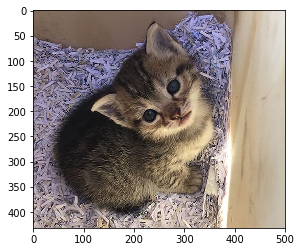

Posición, x:0, y:0


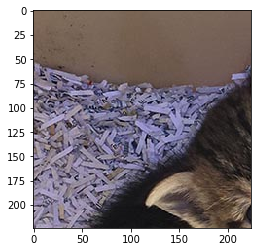

Posición, x:32, y:0


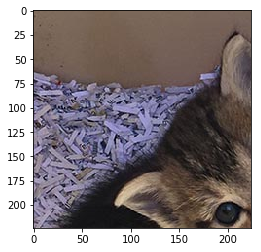

Posición, x:64, y:0


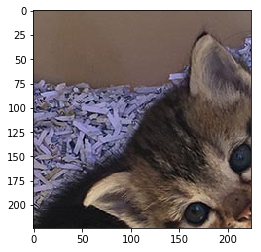

Posición, x:96, y:0


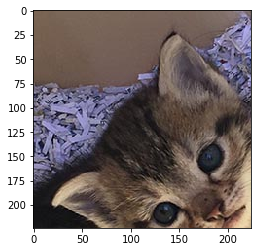

Posición, x:128, y:0


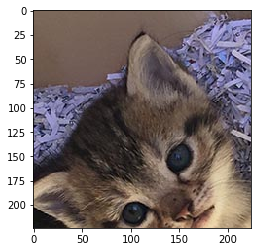

Posición, x:160, y:0


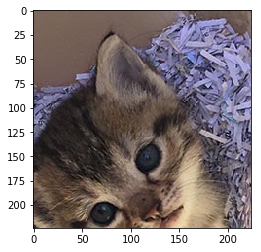

Posición, x:192, y:0


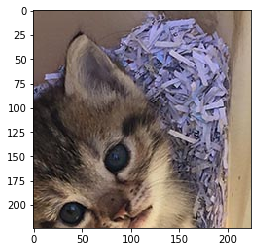

Posición, x:224, y:0


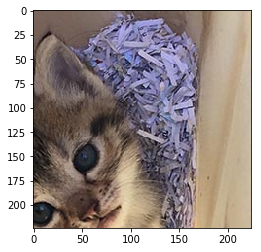

Posición, x:256, y:0


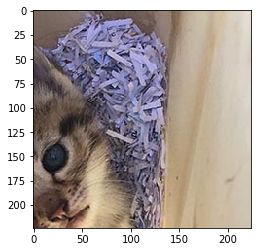

Posición, x:0, y:32


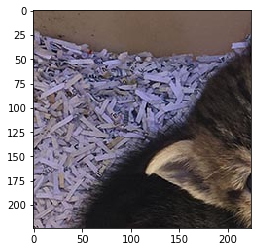

Posición, x:32, y:32


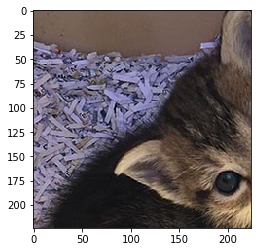

Posición, x:64, y:32


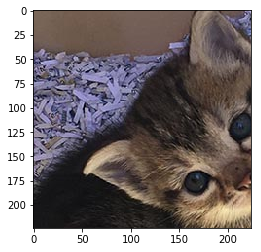

Posición, x:96, y:32


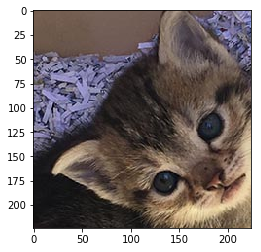

Posición, x:128, y:32


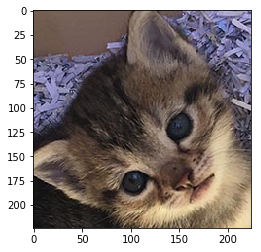

Posición, x:160, y:32


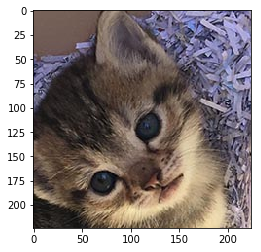

Posición, x:192, y:32


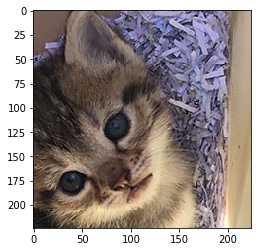

Posición, x:224, y:32


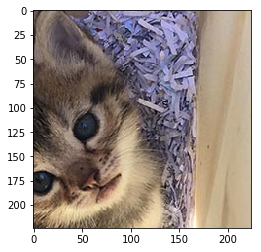

Posición, x:256, y:32


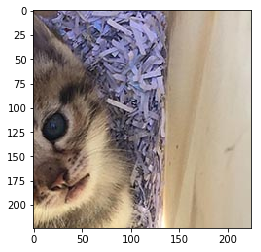

Posición, x:0, y:64


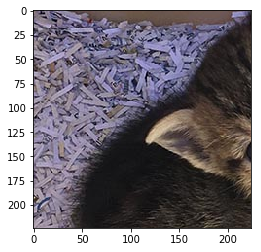

Posición, x:32, y:64


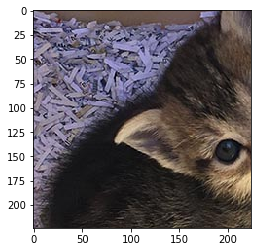

Posición, x:64, y:64


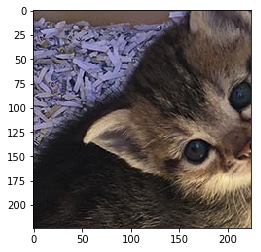

Posición, x:96, y:64


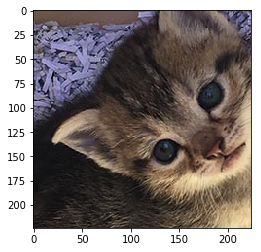

Posición, x:128, y:64


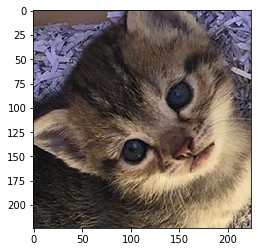

Posición, x:160, y:64


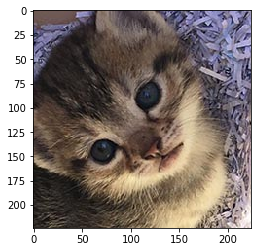

Posición, x:192, y:64


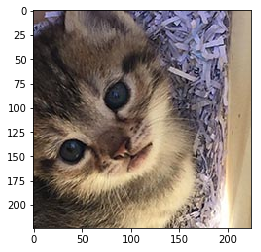

Posición, x:224, y:64


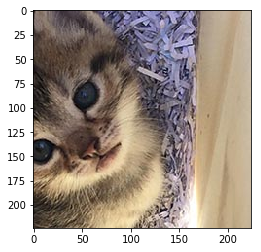

Posición, x:256, y:64


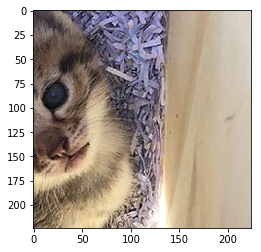

Posición, x:0, y:96


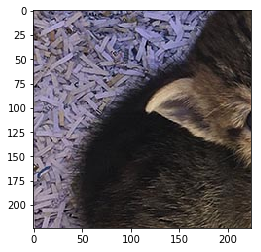

Posición, x:32, y:96


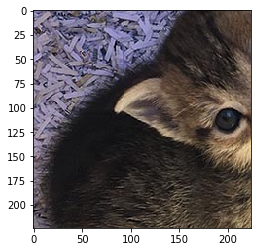

Posición, x:64, y:96


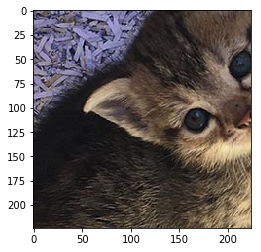

Posición, x:96, y:96


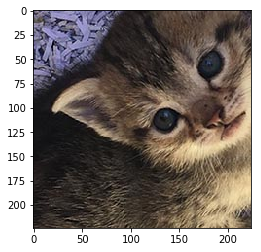

Posición, x:128, y:96


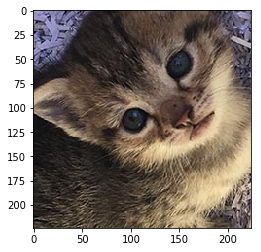

Posición, x:160, y:96


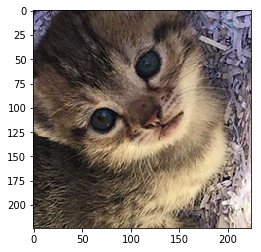

Posición, x:192, y:96


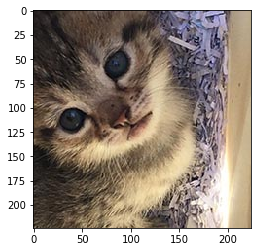

Posición, x:224, y:96


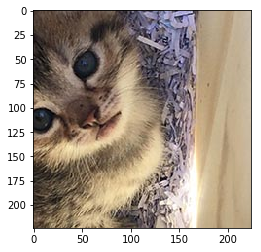

Posición, x:256, y:96


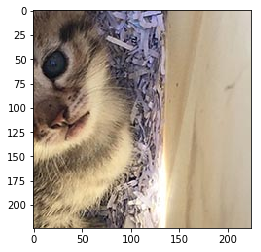

Posición, x:0, y:128


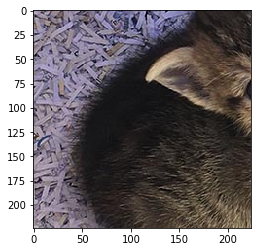

Posición, x:32, y:128


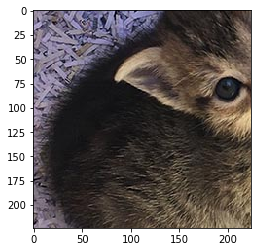

Posición, x:64, y:128


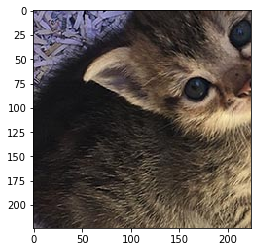

Posición, x:96, y:128


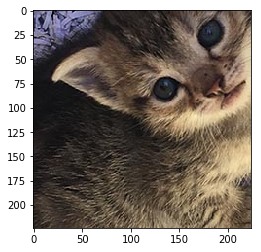

Posición, x:128, y:128


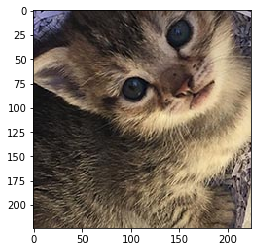

Posición, x:160, y:128


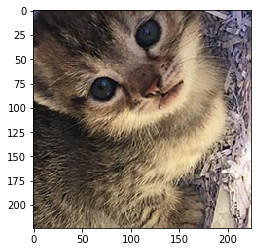

Posición, x:192, y:128


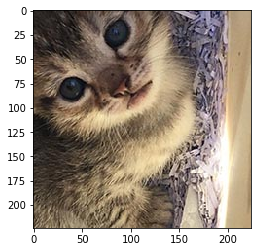

Posición, x:224, y:128


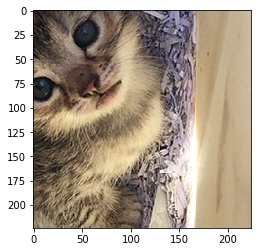

Posición, x:256, y:128


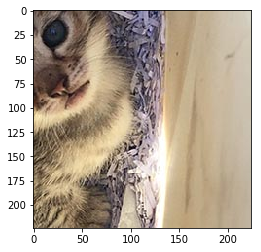

Posición, x:0, y:160


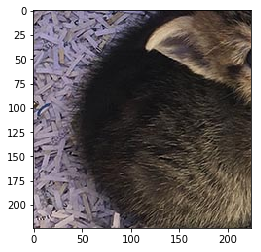

Posición, x:32, y:160


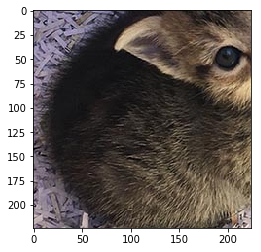

Posición, x:64, y:160


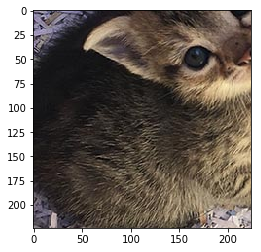

Posición, x:96, y:160


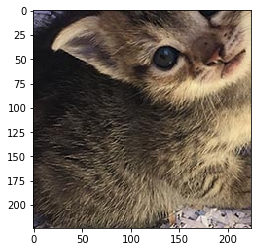

Posición, x:128, y:160


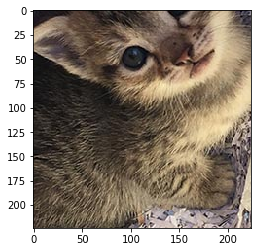

Posición, x:160, y:160


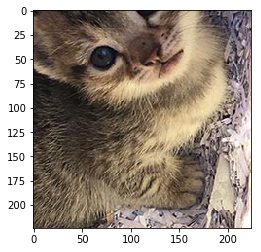

Posición, x:192, y:160


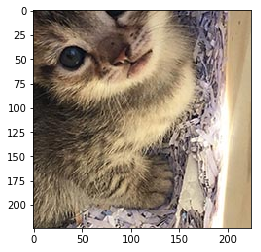

Posición, x:224, y:160


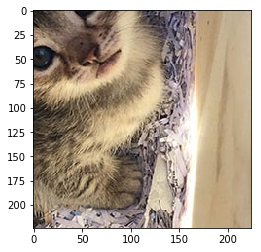

Posición, x:256, y:160


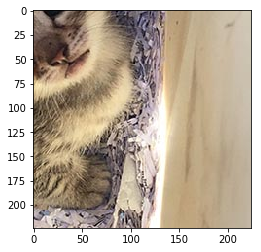

Posición, x:0, y:192


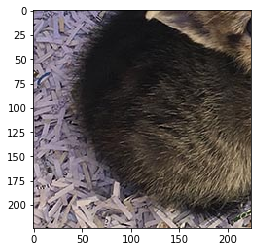

Posición, x:32, y:192


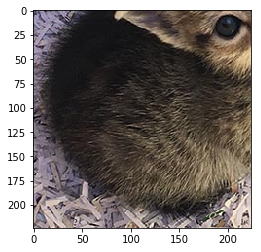

Posición, x:64, y:192


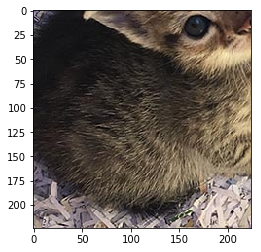

Posición, x:96, y:192


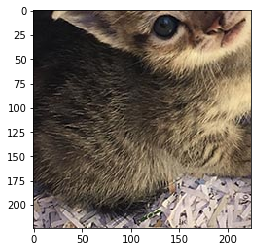

Posición, x:128, y:192


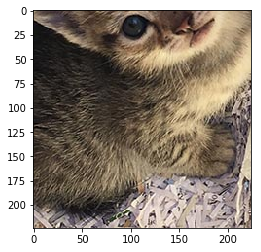

Posición, x:160, y:192


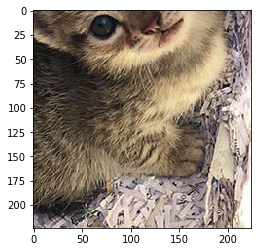

Posición, x:192, y:192


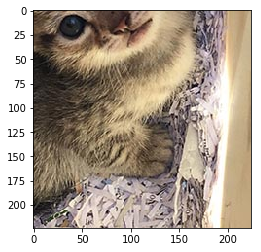

Posición, x:224, y:192


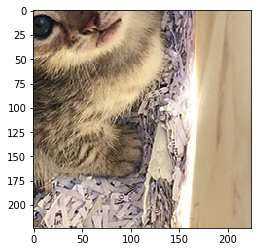

Posición, x:256, y:192


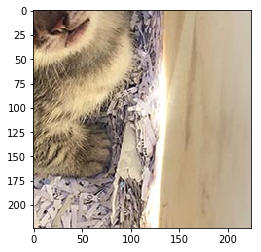

In [0]:
# Cargamos imagen
image = cv2.imread("gatitopeque.jpg")
# Mostramos la imagen original
mostrarImagen(image)
# Generamos las distintas ventanas utilizando un paso de 32 y un tamaño de ventana 224x224
ventanas = sliding_window(image,32,(224, 224))
for x,y,roi in ventanas:
  # Para cada ventana mostramos su posición
  print("Posición, x:" + str(x) + ", y:" + str(y) )
  # Y también mostramos lo que se ve en esa ventana
  mostrarImagen(roi)

## Pirámide de imágenes
Una pirámide de imágenes es una representación de varias escalas de una imagen, se usan para encontrar objetos de distintos tamaños en la imagen. Al combinar una pirámide de imágenes con una ventana deslizante, podemos encontrar objetos en imágenes tanto en ubicaciones variables como en distintas escalas. Esta función tiene tres argumentos: la imagen, la reducción de la escala (que por defecto toma el valor 1.5) y el tamaño mínimo de la imagen a escalar para que cuando la imagen sea más pequeña que este tamaño el proceso se detenga.

In [0]:
def image_pyramid(image, scale=1.5, minSize=(224, 224)):
    # produce la imagen original
    yield image
    #repite el proceso de la pirámide de imágenes
    while True:
        # se calcula las dimensiones de la siguiente imagen en la pirámide
        w = int(image.shape[1] / scale)
        image = imutils.resize(image, width=w)

        # si la imagen redimensionada no cumple con el tamaño mínimo 
        #proporcionado, entonces deja de construir la pirámide
        if image.shape[0] < minSize[1] or image.shape[1] < minSize[0]:
            break
            
        yield image


Veamos un ejemplo para ver como funciona.

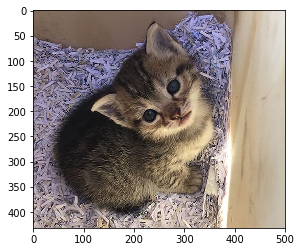

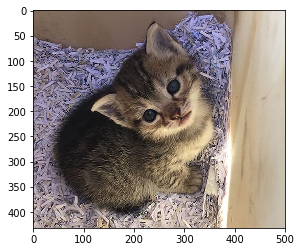

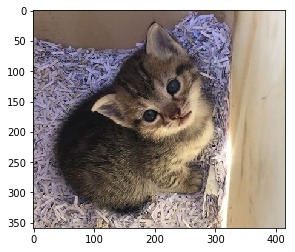

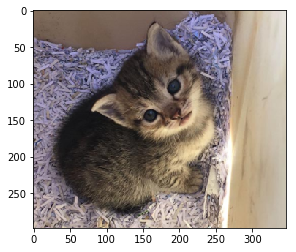

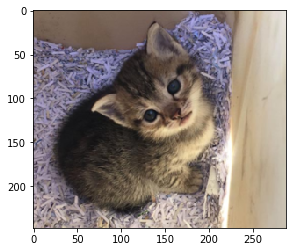

In [0]:
# Mostramos la imagen original
mostrarImagen(image)
# Generamos la pirámide de imágenes
piramide = image_pyramid(image,scale=1.2)
for im in piramide:
  # Mostramos cada imagen de la pirámide
  mostrarImagen(im)

## Procesamiento
Una vez que ya sabemos cómo aplicar las pirámides de imágenes y las ventanas deslizante, tenemos que saber predecir que la clase para cada región de interés. Los parámetros de está función son:
- Model es un modelo de predicción de Keras que posee una función predict que actúa como si estuviéramos clasificando.
- BatchROIs es una lista de las ventanas para las cuales se va a hacer la predicción.
- BatchLocs es una lista de las posiciones de las ventanas de batchROIs. 
- Labels es una lista de posibles clases a las que puede pertenecer la imagen.
- MinProb es la probabilidad mínima para que una predicción se considere como válida.
- Top es el número de predicciones que debe devolver la red.
- Dim es la dimensión del cuadro delimitador.
- Valid_classes es una lista de las clases de los objetos que queramos detectar. Esta es la [lista](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a) de las clases que podemos detectar.

In [0]:
def classify_batch(model, batchROIs, batchLocs, labels, minProb=0.5,
    top=10, dims=(224, 224), valid_classes = None):
    # predecimos las clases de las ventanas
    preds = model.predict(batchROIs)
    P = imagenet_utils.decode_predictions(preds, top=top)

    # para cada una de las predicciones
    for i in range(0, len(P)):
        for (_, label, prob) in P[i]:
            # filtramos las detecciones débiles, para ello la probabilidad 
            # predicha debe ser mayor que la mínima y encontrarse entre las 
            # clases que queremos detectar
            if (prob > minProb and (valid_classes == None or label in valid_classes)
                                 ):
                # tomamos las coordenadas de la ventana deslizante para la pre-
                # dicción y construcción del cuadro delimitador
                (pX, pY) = batchLocs[i]
                box = (pX, pY, pX + dims[0], pY + dims[1])

                #tomamos la lista de predicciones y ponemos el cuadro delimitador
                L = labels.get(label, [])
                L.append((box, prob))
                labels[label] = L

    # devolvemos el diccionario de las etiquetas, donde para cada etiqueta 
    # almacenamos un par con la posición y la probabilidad para esa etiqueta
    return labels

# Ejemplo 1

En este ejemplo dada una imagen vamos a detectar y clasificar los objetos que aparezcan en ella.

### Inicialización de variables
Iniciamos las variables que controlan cómo se realiza la detección de objetos:
* Input_size: es el ancho y el alto de nuestra imagen de entrada.
* Pyr_scale: escala de nuestra pirámide de imágenes.
* Win_step: el step de nuestra ventana deslizante.
* Roi_size: el tamaño de las regiones de interés.
* Batch_size: el tamaño del lote que se contruye y pasa a través de la red.

In [0]:
# inicializamos las variables que vamos a usar en la detección
INPUT_SIZE = (350, 350)
PYR_SCALE = 1.5
WIN_STEP = 16
ROI_SIZE = (224, 224)
BATCH_SIZE = 64

### ResNet50
Iniciamos la red [ResNet50](https://arxiv.org/abs/1512.03385), con los pesos de ImageNet. Esta es la red que luego utilizaremos como modelo para hacer las predicciones.

In [0]:
# cargamos los pesos de la red
print("[INFO] cargando la red...")
model = ResNet50(weights="imagenet", include_top=True)

[INFO] cargando la red...


Iniciamos el diccionario de detección de objetos que va a asignar las etiquetas de clase a los cuadros delimitadores predichos.

In [0]:
labels = {}

Cargamos la imagen de entrada y tomamos sus dimensiones

In [0]:
orig = cv2.imread("gala.jpeg")
(h, w) = orig.shape[:2]

Cambiamos el tamaño de la imagen de entrada para que sea un cuadrado e iniciamos el lote de las regiones de interés.

In [0]:
resized = cv2.resize(orig, INPUT_SIZE, interpolation=cv2.INTER_CUBIC)

batchROIs = None
batchLocs = []

Comenzamos recorriendo cada escala de la imagen, generadas por la función `image_pyramid`. Para cada una de estas escalas aplicamos la ventana deslizante para extraer las regiones de interés. Se hace un preprocesamiento de las regiones y cuando el lote está lleno clasificamos las regiones.

In [0]:
instanteInicial = datetime.now()
(winW, winH) = ROI_SIZE
# bucle sobre la pirámide de imágenes
for im in image_pyramid(resized, scale=PYR_SCALE):
    # pasamos la ventana deslizante sobre la pirámide
    #for (x, y, window) in sliding_window(im, step=32, ws=(winW, winH)):
    for (x, y, window) in sliding_window(im, step=WIN_STEP, ws=ROI_SIZE):
        # tomamos la región de interés y la preprocesamos para poder 
        # clasificar la región con keras
        window = img_to_array(window)
        window = np.expand_dims(window, axis=0)
        window = imagenet_utils.preprocess_input(window)
        # si el conjunto está vacío, lo iniciamos
        if batchROIs is None:
            batchROIs = window
        else: #en caso contrario, lo añadimos
            batchROIs = np.vstack([batchROIs, window])
        #agregamos la coordenada de la ventana al conjunto
        batchLocs.append((x,y))
        if len(batchROIs)==BATCH_SIZE:
            #clasificamos el conjunto
            labels = classify_batch(model, batchROIs, batchLocs, labels, minProb=0.5)

# comprobamos si hay alguna región de interés que aún no haya sido clasificada
if batchROIs is not None:
    labels = classify_batch(model, batchROIs, batchLocs, labels,
        minProb=0.5)

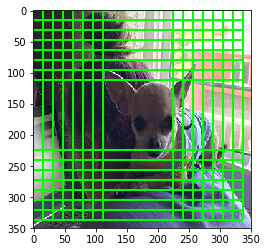

[INFO] Chihuahua: 1


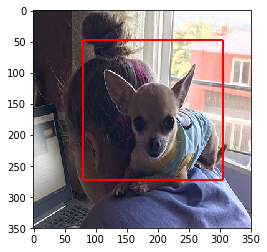

463


In [0]:

for k in labels.keys():
    # clonamos la imagen de entrada
    clone = resized.copy()

    # recorremos todos los cuadros delimitadores y los dibujamos sobre la imagen
    for (box, prob) in labels[k]:
        (xA, yA, xB, yB) = box
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 255, 0), 2)

    # mostramos la imagen sin aplicar la supresión máxima
    mostrarImagen(clone)
    clone = resized.copy()

    # agregamos los cuadros delimitadores y las probabilidades asociadas para 
    # cada una de las detecciones
    boxes = np.array([p[0] for p in labels[k]])
    # y las probabilidades asociadas para cada una de las detecciones
    proba = np.array([p[1] for p in labels[k]])
    # y aplicamos la supresión máxima
    boxes = non_max_suppression(boxes, proba)

    # volvemos a recorrer los cuadros delimitadores para dibujar sobre la imagen
    # los que no hayan sido suprimidos
    for (xA, yA, xB, yB) in boxes:
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 0, 255), 2)

    # mostramos la imagen final
    print("[INFO] {}: {}".format(k, len(boxes)))
    mostrarImagen(clone)
instanteFinal = datetime.now()
tiempo = instanteFinal - instanteInicial # Devuelve un objeto timedelta
segundos = tiempo.seconds
print("La detección ha llevado {:.1f} segundos".format(segundos))

## Ejemplo 2:

En el ejemplo anterior hemos visto como se clasifican todos los objetos que se encuentren en la imagen dando igual de que clase sean. Pero en el siguente ejemplo vamos a ver como clasifica sólo los objetos que a nosotros nos interesen, indicándole para ello qué clase queremos que clasifique.

In [0]:
# inicializamos las variables que vamos a usar en la detección
INPUT_SIZE = (350, 350)
PYR_SCALE = 1.5
WIN_STEP = 16
ROI_SIZE = (224, 224)
BATCH_SIZE = 64

### ResNet50
Iniciamos la red [ResNet50](https://arxiv.org/abs/1512.03385), con los pesos de ImageNet. Esta es la red que luego utilizaremos como modelo para hacer las predicciones.

In [0]:
# cargamos los pesos de la red
print("[INFO] cargando la red...")
model = ResNet50(weights="imagenet", include_top=True)

[INFO] cargando la red...


Iniciamos el diccionario de detección de objetos que va a asignar las etiquetas de clase a los cuadros delimitadores predichos.

In [0]:
labels = {}

Cargamos la imagen de entrada y tomamos sus dimensiones

In [0]:
orig = cv2.imread("gala.jpeg")
(h, w) = orig.shape[:2]

Cambiamos el tamaño de la imagen de entrada para que sea un cuadrado e iniciamos el lote de las regiones de interés.

In [0]:
resized = cv2.resize(orig, INPUT_SIZE, interpolation=cv2.INTER_CUBIC)

batchROIs = None
batchLocs = []

Comenzamos recorriendo cada escala de la imagen, generadas por la función `image_pyramid`. Para cada una de estas escalas aplicamos la ventana deslizante para extraer las regiones de interés. Se hace un preprocesamiento de las regiones y cuando el lote está lleno clasificamos las regiones.

In [0]:
instanteInicial = datetime.now()
(winW, winH) = ROI_SIZE
# bucle sobre la pirámide de imágenes
for im in image_pyramid(resized, scale=PYR_SCALE):
    # pasamos la ventana deslizante sobre la pirámide
    #for (x, y, window) in sliding_window(im, step=32, ws=(winW, winH)):
    for (x, y, window) in sliding_window(im, step=WIN_STEP, ws=ROI_SIZE):
        # tomamos la región de interés y la preprocesamos para poder 
        # clasificar la región con keras
        window = img_to_array(window)
        window = np.expand_dims(window, axis=0)
        window = imagenet_utils.preprocess_input(window)
        # si el conjunto está vacío, lo iniciamos
        if batchROIs is None:
            batchROIs = window
        else: #en caso contrario, lo añadimos
            batchROIs = np.vstack([batchROIs, window])
        #agregamos la coordenada de la ventana al conjunto
        batchLocs.append((x,y))

        if len(batchROIs)==BATCH_SIZE:
            #clasificamos el conjunto
            labels = classify_batch(model, batchROIs, batchLocs, labels, minProb=0.5, valid_classes=["Chihuahua"])

# comprobamos si hay alguna región de interés que aún no haya sido clasificada
if batchROIs is not None:
    labels = classify_batch(model, batchROIs, batchLocs, labels,
        minProb=0.5, valid_classes=["Chihuahua"])

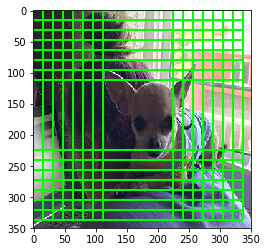

[INFO] Chihuahua: 1


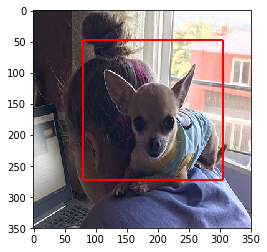

La detección ha llevado 154.0


In [0]:
for k in labels.keys():
    # clonamos la imagen de entrada
    clone = resized.copy()

    # recorremos todos los cuadros delimitadores y los dibujamos sobre la imagen
    for (box, prob) in labels[k]:
        (xA, yA, xB, yB) = box
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 255, 0), 2)

    # mostramos la imagen sin aplicar la supresión máxima
    mostrarImagen(clone)
    clone = resized.copy()

    # agregamos los cuadros delimitadores y las probabilidades asociadas para 
    # cada una de las detecciones
    boxes = np.array([p[0] for p in labels[k]])
    # y las probabilidades asociadas para cada una de las detecciones
    proba = np.array([p[1] for p in labels[k]])
    # y aplicamos la supresión máxima
    boxes = non_max_suppression(boxes, proba)

    # volvemos a recorrer los cuadros delimitadores para dibujar sobre la imagen
    # los que no hayan sido suprimidos
    for (xA, yA, xB, yB) in boxes:
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 0, 255), 2)

    # mostramos la imagen final
    print("[INFO] {}: {}".format(k, len(boxes)))
    mostrarImagen(clone)
instanteFinal = datetime.now()
tiempo = instanteFinal - instanteInicial # Devuelve un objeto timedelta
segundos = tiempo.seconds
print("La detección ha llevado {:.1f} segundos".format(segundos))

## Ejemplo 3:

Podemos pensar que el decirle que busque una clase en concreto no funciona y lo detecta y clasifique sin tener en cuenta esa clase, por eso en este ejemplo vamos a buscar una clase que no coincide con el objeto de la imagen.

### Inicialización de variables

In [0]:
# inicializamos las variables que vamos a usar en la detección
INPUT_SIZE = (350, 350)
PYR_SCALE = 1.5
WIN_STEP = 16
ROI_SIZE = (224, 224)
BATCH_SIZE = 64

### ResNet50
Iniciamos la red [ResNet50](https://arxiv.org/abs/1512.03385), con los pesos de ImageNet. Esta es la red que luego utilizaremos como modelo para hacer las predicciones.

In [0]:
# cargamos los pesos de la red
print("[INFO] cargando la red...")
model = ResNet50(weights="imagenet", include_top=True)

[INFO] cargando la red...


Iniciamos el diccionario de detección de objetos que va a asignar las etiquetas de clase a los cuadros delimitadores predichos.

In [0]:
labels = {}

Cargamos la imagen de entrada y tomamos sus dimensiones

In [0]:
orig = cv2.imread("gatitopeque.jpg")
(h, w) = orig.shape[:2]

Cambiamos el tamaño de la imagen de entrada para que sea un cuadrado e iniciamos el lote de las regiones de interés.

In [0]:
resized = cv2.resize(orig, INPUT_SIZE, interpolation=cv2.INTER_CUBIC)

batchROIs = None
batchLocs = []

Comenzamos recorriendo cada escala de la imagen, generadas por la función `image_pyramid`. Para cada una de estas escalas aplicamos la ventana deslizante para extraer las regiones de interés. Se hace un preprocesamiento de las regiones y cuando el lote está lleno clasificamos las regiones.

In [0]:
instanteInicial = datetime.now()
(winW, winH) = ROI_SIZE
# bucle sobre la pirámide de imágenes
for im in image_pyramid(resized, scale=PYR_SCALE):
    # pasamos la ventana deslizante sobre la pirámide
    #for (x, y, window) in sliding_window(im, step=32, ws=(winW, winH)):
    for (x, y, window) in sliding_window(im, step=WIN_STEP, ws=ROI_SIZE):
        # tomamos la región de interés y la preprocesamos para poder 
        # clasificar la región con keras
        window = img_to_array(window)
        window = np.expand_dims(window, axis=0)
        window = imagenet_utils.preprocess_input(window)
        # si el conjunto está vacío, lo iniciamos
        if batchROIs is None:
            batchROIs = window
        else: #en caso contrario, lo añadimos
            batchROIs = np.vstack([batchROIs, window])
        #agregamos la coordenada de la ventana al conjunto
        batchLocs.append((x,y))

        if len(batchROIs)==BATCH_SIZE:
            #clasificamos el conjunto
            labels = classify_batch(model, batchROIs, batchLocs, labels, minProb=0.5)

# comprobamos si hay alguna región de interés que aún no haya sido clasificada
if batchROIs is not None:
    labels = classify_batch(model, batchROIs, batchLocs, labels,
        minProb=0.5)

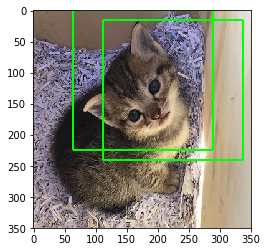

[INFO] Persian_cat: 1


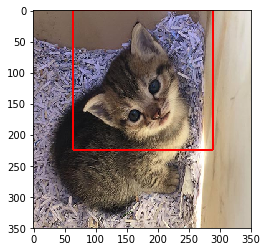

La detección ha llevado 169.0


In [0]:

for k in labels.keys():
    # clonamos la imagen de entrada
    clone = resized.copy()

    # recorremos todos los cuadros delimitadores y los dibujamos sobre la imagen
    for (box, prob) in labels[k]:
        (xA, yA, xB, yB) = box
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 255, 0), 2)

    # mostramos la imagen sin aplicar la supresión máxima
    mostrarImagen(clone)
    clone = resized.copy()

    # agregamos los cuadros delimitadores y las probabilidades asociadas para 
    # cada una de las detecciones
    boxes = np.array([p[0] for p in labels[k]])
    # y las probabilidades asociadas para cada una de las detecciones
    proba = np.array([p[1] for p in labels[k]])
    # y aplicamos la supresión máxima
    boxes = non_max_suppression(boxes, proba)

    # volvemos a recorrer los cuadros delimitadores para dibujar sobre la imagen
    # los que no hayan sido suprimidos
    for (xA, yA, xB, yB) in boxes:
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 0, 255), 2)

    # mostramos la imagen final
    print("[INFO] {}: {}".format(k, len(boxes)))
    mostrarImagen(clone)
instanteFinal = datetime.now()
tiempo = instanteFinal - instanteInicial # Devuelve un objeto timedelta
segundos = tiempo.seconds
print("La detección ha llevado {:.1f} segundos".format(segundos))

Una vez que vemos que es capaz de clasificar el objeto de la imagen, vamos a decirle que busque otra clase que no sea la de gato persa.

Para ello vamos a inicar el diccionario de detección de objetos que va a asignar las etiquetas de clase a los cuadros delimitadores predichos.

### Inicialización de variables

In [0]:
# inicializamos las variables que vamos a usar en la detección
INPUT_SIZE = (350, 350)
PYR_SCALE = 1.5
WIN_STEP = 16
ROI_SIZE = (224, 224)
BATCH_SIZE = 64

### ResNet50
Iniciamos la red [ResNet50](https://arxiv.org/abs/1512.03385), con los pesos de ImageNet. Esta es la red que luego utilizaremos como modelo para hacer las predicciones.

In [0]:
# cargamos los pesos de la red
print("[INFO] cargando la red...")
model = ResNet50(weights="imagenet", include_top=True)

[INFO] cargando la red...


Iniciamos el diccionario de detección de objetos que va a asignar las etiquetas de clase a los cuadros delimitadores predichos.

In [0]:
labels = {}

Cargamos la imagen de entrada y tomamos sus dimensiones

In [0]:
orig = cv2.imread("gatitopeque.jpg")
(h, w) = orig.shape[:2]

Cambiamos el tamaño de la imagen de entrada para que sea un cuadrado e iniciamos el lote de las regiones de interés.

In [0]:
resized = cv2.resize(orig, INPUT_SIZE, interpolation=cv2.INTER_CUBIC)

batchROIs = None
batchLocs = []

Comenzamos recorriendo cada escala de la imagen, generadas por la función `image_pyramid`. Para cada una de estas escalas aplicamos la ventana deslizante para extraer las regiones de interés. Se hace un preprocesamiento de las regiones y cuando el lote está lleno clasificamos las regiones.

In [0]:
instanteInicial = datetime.now()
(winW, winH) = ROI_SIZE
# bucle sobre la pirámide de imágenes
for im in image_pyramid(resized, scale=PYR_SCALE):
    # pasamos la ventana deslizante sobre la pirámide
    #for (x, y, window) in sliding_window(im, step=32, ws=(winW, winH)):
    for (x, y, window) in sliding_window(im, step=WIN_STEP, ws=ROI_SIZE):
        # tomamos la región de interés y la preprocesamos para poder 
        # clasificar la región con keras
        window = img_to_array(window)
        window = np.expand_dims(window, axis=0)
        window = imagenet_utils.preprocess_input(window)
        # si el conjunto está vacío, lo iniciamos
        if batchROIs is None:
            batchROIs = window
        else: #en caso contrario, lo añadimos
            batchROIs = np.vstack([batchROIs, window])
        #agregamos la coordenada de la ventana al conjunto
        batchLocs.append((x,y))

        if len(batchROIs)==BATCH_SIZE:
            #clasificamos el conjunto
            labels = classify_batch(model, batchROIs, batchLocs, labels, minProb=0.5, valid_classes=["Chihuahua"])

# comprobamos si hay alguna región de interés que aún no haya sido clasificada
if batchROIs is not None:
    labels = classify_batch(model, batchROIs, batchLocs, labels,
        minProb=0.5, valid_classes=["Chihuahua"])

In [0]:
for k in labels.keys():
    # clonamos la imagen de entrada
    clone = resized.copy()

    # recorremos todos los cuadros delimitadores y los dibujamos sobre la imagen
    for (box, prob) in labels[k]:
        (xA, yA, xB, yB) = box
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 255, 0), 2)

    # mostramos la imagen sin aplicar la supresión máxima
    mostrarImagen(clone)
    clone = resized.copy()

    # agregamos los cuadros delimitadores y las probabilidades asociadas para 
    # cada una de las detecciones
    boxes = np.array([p[0] for p in labels[k]])
    # y las probabilidades asociadas para cada una de las detecciones
    proba = np.array([p[1] for p in labels[k]])
    # y aplicamos la supresión máxima
    boxes = non_max_suppression(boxes, proba)

    # volvemos a recorrer los cuadros delimitadores para dibujar sobre la imagen
    # los que no hayan sido suprimidos
    for (xA, yA, xB, yB) in boxes:
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 0, 255), 2)

    # mostramos la imagen final
    print("[INFO] {}: {}".format(k, len(boxes)))
    mostrarImagen(clone)
instanteFinal = datetime.now()
tiempo = instanteFinal - instanteInicial # Devuelve un objeto timedelta
segundos = tiempo.seconds
print("La detección ha llevado {:.1f} segundos".format(segundos))

La detección ha llevado 289.0


Aqui podemos ver que no es capaz de encontrar al chihuahua en la imagen y por lo tanto no muestra nada. Ahora hacemos el mismo ejemplo pero buscando un gato persa.

### Inicialización de variables

In [0]:
# inicializamos las variables que vamos a usar en la detección
INPUT_SIZE = (350, 350)
PYR_SCALE = 1.5
WIN_STEP = 16
ROI_SIZE = (224, 224)
BATCH_SIZE = 64

### ResNet50
Iniciamos la red [ResNet50](https://arxiv.org/abs/1512.03385), con los pesos de ImageNet. Esta es la red que luego utilizaremos como modelo para hacer las predicciones.

In [0]:
# cargamos los pesos de la red
print("[INFO] cargando la red...")
model = ResNet50(weights="imagenet", include_top=True)

[INFO] cargando la red...


Para ello vamos a inicar el diccionario de detección de objetos que va a asignar las etiquetas de clase a los cuadros delimitadores predichos.

In [0]:
labels = {}

Cargamos la imagen de entrada y tomamos sus dimensiones

In [0]:
orig = cv2.imread("gatitopeque.jpg")
(h, w) = orig.shape[:2]

Cambiamos el tamaño de la imagen de entrada para que sea un cuadrado e iniciamos el lote de las regiones de interés.

In [0]:
resized = cv2.resize(orig, INPUT_SIZE, interpolation=cv2.INTER_CUBIC)

batchROIs = None
batchLocs = []

Comenzamos recorriendo cada escala de la imagen, generadas por la función `image_pyramid`. Para cada una de estas escalas aplicamos la ventana deslizante para extraer las regiones de interés. Se hace un preprocesamiento de las regiones y cuando el lote está lleno clasificamos las regiones.

In [0]:
instanteInicial = datetime.now()
(winW, winH) = ROI_SIZE
# bucle sobre la pirámide de imágenes
for im in image_pyramid(resized, scale=PYR_SCALE):
    # pasamos la ventana deslizante sobre la pirámide
    #for (x, y, window) in sliding_window(im, step=32, ws=(winW, winH)):
    for (x, y, window) in sliding_window(im, step=WIN_STEP, ws=ROI_SIZE):
        # tomamos la región de interés y la preprocesamos para poder 
        # clasificar la región con keras
        window = img_to_array(window)
        window = np.expand_dims(window, axis=0)
        window = imagenet_utils.preprocess_input(window)
        # si el conjunto está vacío, lo iniciamos
        if batchROIs is None:
            batchROIs = window
        else: #en caso contrario, lo añadimos
            batchROIs = np.vstack([batchROIs, window])
        #agregamos la coordenada de la ventana al conjunto
        batchLocs.append((x,y))

        if len(batchROIs)==BATCH_SIZE:
            #clasificamos el conjunto
            labels = classify_batch(model, batchROIs, batchLocs, labels, minProb=0.5, valid_classes=["Persian_cat"])

# comprobamos si hay alguna región de interés que aún no haya sido clasificada
if batchROIs is not None:
    labels = classify_batch(model, batchROIs, batchLocs, labels,
        minProb=0.5, valid_classes=["Persian_cat"])

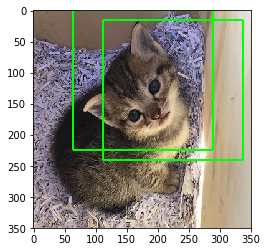

[INFO] Persian_cat: 1


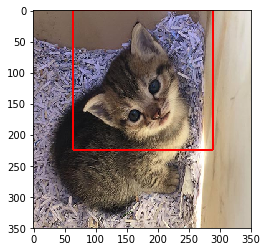

La detección ha llevado 217.0 segundos


In [0]:
for k in labels.keys():
    # clonamos la imagen de entrada
    clone = resized.copy()

    # recorremos todos los cuadros delimitadores y los dibujamos sobre la imagen
    for (box, prob) in labels[k]:
        (xA, yA, xB, yB) = box
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 255, 0), 2)

    # mostramos la imagen sin aplicar la supresión máxima
    mostrarImagen(clone)
    clone = resized.copy()

    # agregamos los cuadros delimitadores y las probabilidades asociadas para 
    # cada una de las detecciones
    boxes = np.array([p[0] for p in labels[k]])
    # y las probabilidades asociadas para cada una de las detecciones
    proba = np.array([p[1] for p in labels[k]])
    # y aplicamos la supresión máxima
    boxes = non_max_suppression(boxes, proba)

    # volvemos a recorrer los cuadros delimitadores para dibujar sobre la imagen
    # los que no hayan sido suprimidos
    for (xA, yA, xB, yB) in boxes:
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 0, 255), 2)

    # mostramos la imagen final
    print("[INFO] {}: {}".format(k, len(boxes)))
    mostrarImagen(clone)
instanteFinal = datetime.now()
tiempo = instanteFinal - instanteInicial # Devuelve un objeto timedelta
segundos = tiempo.seconds
print("La detección ha llevado {:.1f} segundos".format(segundos))

## Ejemplo 4:

En este último ejemplo vamos a tratar la detección y clasificación de varios objetos en una misma imagen.

### Inicialización de variables

In [0]:
# inicializamos las variables que vamos a usar en la detección
INPUT_SIZE = (350, 350)
PYR_SCALE = 1.5
WIN_STEP = 16
ROI_SIZE = (224, 224)
BATCH_SIZE = 64

### ResNet50
Iniciamos la red [ResNet50](https://arxiv.org/abs/1512.03385), con los pesos de ImageNet. Esta es la red que luego utilizaremos como modelo para hacer las predicciones.

In [0]:
# cargamos los pesos de la red
print("[INFO] cargando la red...")
model = ResNet50(weights="imagenet", include_top=True)

[INFO] cargando la red...


Para ello vamos a inicar el diccionario de detección de objetos que va a asignar las etiquetas de clase a los cuadros delimitadores predichos.

In [0]:
labels = {}

Cargamos la imagen de entrada y tomamos sus dimensiones

In [0]:
orig = cv2.imread("galaygatito.jpg")
(h, w) = orig.shape[:2]

Cambiamos el tamaño de la imagen de entrada para que sea un cuadrado e iniciamos el lote de las regiones de interés.

In [0]:
resized = cv2.resize(orig, INPUT_SIZE, interpolation=cv2.INTER_CUBIC)

batchROIs = None
batchLocs = []

Comenzamos recorriendo cada escala de la imagen, generadas por la función `image_pyramid`. Para cada una de estas escalas aplicamos la ventana deslizante para extraer las regiones de interés. Se hace un preprocesamiento de las regiones y cuando el lote está lleno clasificamos las regiones.

In [0]:
instanteInicial = datetime.now()
(winW, winH) = ROI_SIZE
# bucle sobre la pirámide de imágenes
for im in image_pyramid(resized, scale=PYR_SCALE):
    # pasamos la ventana deslizante sobre la pirámide
    #for (x, y, window) in sliding_window(im, step=32, ws=(winW, winH)):
    for (x, y, window) in sliding_window(im, step=WIN_STEP, ws=ROI_SIZE):
        # tomamos la región de interés y la preprocesamos para poder 
        # clasificar la región con keras
        window = img_to_array(window)
        window = np.expand_dims(window, axis=0)
        window = imagenet_utils.preprocess_input(window)
        # si el conjunto está vacío, lo iniciamos
        if batchROIs is None:
            batchROIs = window
        else: #en caso contrario, lo añadimos
            batchROIs = np.vstack([batchROIs, window])
        #agregamos la coordenada de la ventana al conjunto
        batchLocs.append((x,y))

        if len(batchROIs)==BATCH_SIZE:
            #clasificamos el conjunto
            labels = classify_batch(model, batchROIs, batchLocs, labels, minProb=0.5)

# comprobamos si hay alguna región de interés que aún no haya sido clasificada
if batchROIs is not None:
    labels = classify_batch(model, batchROIs, batchLocs, labels,
        minProb=0.5)

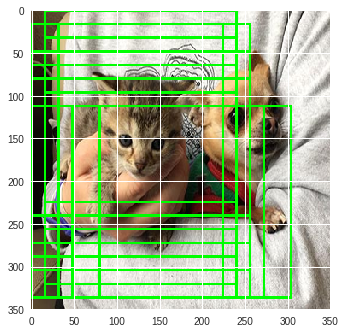

[INFO] Egyptian_cat: 1


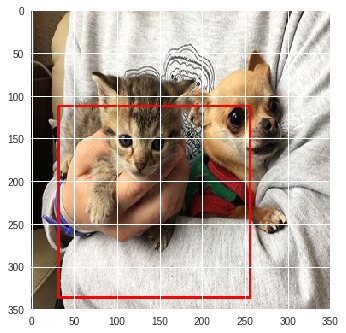

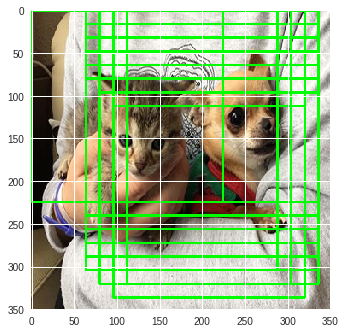

[INFO] Chihuahua: 1


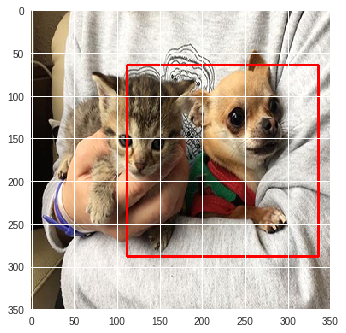

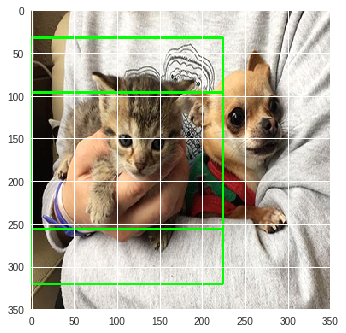

[INFO] lynx: 1


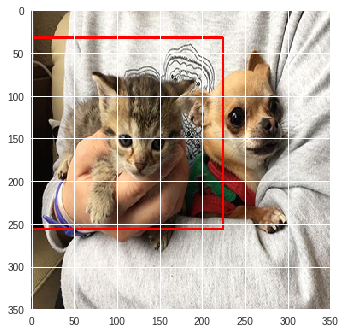

La detección ha llevado 5.0 segundos


In [0]:
for k in labels.keys():
    # clonamos la imagen de entrada
    clone = resized.copy()

    # recorremos todos los cuadros delimitadores y los dibujamos sobre la imagen
    for (box, prob) in labels[k]:
        (xA, yA, xB, yB) = box
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 255, 0), 2)

    # mostramos la imagen sin aplicar la supresión máxima
    mostrarImagen(clone)
    clone = resized.copy()

    # agregamos los cuadros delimitadores y las probabilidades asociadas para 
    # cada una de las detecciones
    boxes = np.array([p[0] for p in labels[k]])
    # y las probabilidades asociadas para cada una de las detecciones
    proba = np.array([p[1] for p in labels[k]])
    # y aplicamos la supresión máxima
    boxes = non_max_suppression(boxes, proba)

    # volvemos a recorrer los cuadros delimitadores para dibujar sobre la imagen
    # los que no hayan sido suprimidos
    for (xA, yA, xB, yB) in boxes:
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 0, 255), 2)

    # mostramos la imagen final
    print("[INFO] {}: {}".format(k, len(boxes)))
    mostrarImagen(clone)
instanteFinal = datetime.now()
tiempo = instanteFinal - instanteInicial # Devuelve un objeto timedelta
segundos = tiempo.seconds
print("La detección ha llevado {:.1f} segundos".format(segundos))

Y ahora que tenemos varios objetos en la misma imagen y que hemos visto cómo los detecta vamos a indicarle que sólo nos detecte uno de ello, en este caso el gato.

### Inicialización de variables

In [0]:
# inicializamos las variables que vamos a usar en la detección
INPUT_SIZE = (350, 350)
PYR_SCALE = 1.5
WIN_STEP = 16
ROI_SIZE = (224, 224)
BATCH_SIZE = 64

### ResNet50
Iniciamos la red [ResNet50](https://arxiv.org/abs/1512.03385), con los pesos de ImageNet. Esta es la red que luego utilizaremos como modelo para hacer las predicciones.

In [0]:
# cargamos los pesos de la red
print("[INFO] cargando la red...")
model = ResNet50(weights="imagenet", include_top=True)

[INFO] cargando la red...


Para ello vamos a inicar el diccionario de detección de objetos que va a asignar las etiquetas de clase a los cuadros delimitadores predichos.

In [0]:
labels = {}

Cargamos la imagen de entrada y tomamos sus dimensiones

In [0]:
orig = cv2.imread("galaygatito.jpg")
(h, w) = orig.shape[:2]

Cambiamos el tamaño de la imagen de entrada para que sea un cuadrado e iniciamos el lote de las regiones de interés.

In [0]:
resized = cv2.resize(orig, INPUT_SIZE, interpolation=cv2.INTER_CUBIC)

batchROIs = None
batchLocs = []

Comenzamos recorriendo cada escala de la imagen, generadas por la función `image_pyramid`. Para cada una de estas escalas aplicamos la ventana deslizante para extraer las regiones de interés. Se hace un preprocesamiento de las regiones y cuando el lote está lleno clasificamos las regiones.

In [0]:
instanteInicial = datetime.now()
(winW, winH) = ROI_SIZE
# bucle sobre la pirámide de imágenes
for im in image_pyramid(resized, scale=PYR_SCALE):
    # pasamos la ventana deslizante sobre la pirámide
    #for (x, y, window) in sliding_window(im, step=32, ws=(winW, winH)):
    for (x, y, window) in sliding_window(im, step=WIN_STEP, ws=ROI_SIZE):
        # tomamos la región de interés y la preprocesamos para poder 
        # clasificar la región con keras
        window = img_to_array(window)
        window = np.expand_dims(window, axis=0)
        window = imagenet_utils.preprocess_input(window)
        # si el conjunto está vacío, lo iniciamos
        if batchROIs is None:
            batchROIs = window
        else: #en caso contrario, lo añadimos
            batchROIs = np.vstack([batchROIs, window])
        #agregamos la coordenada de la ventana al conjunto
        batchLocs.append((x,y))

        if len(batchROIs)==BATCH_SIZE:
            #clasificamos el conjunto
            labels = classify_batch(model, batchROIs, batchLocs, labels, minProb=0.5, valid_classes=["Egyptian_cat"])

# comprobamos si hay alguna región de interés que aún no haya sido clasificada
if batchROIs is not None:
    labels = classify_batch(model, batchROIs, batchLocs, labels,
        minProb=0.5, valid_classes=["Egyptian_cat"])

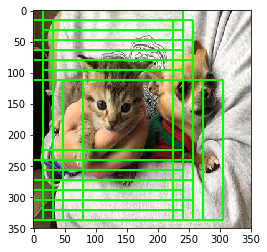

[INFO] Egyptian_cat: 1


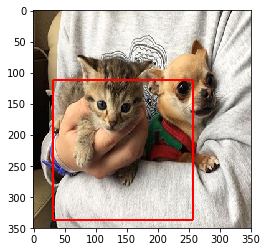

La detección ha llevado 109.0 segundos


In [0]:
for k in labels.keys():
    # clonamos la imagen de entrada
    clone = resized.copy()

    # recorremos todos los cuadros delimitadores y los dibujamos sobre la imagen
    for (box, prob) in labels[k]:
        (xA, yA, xB, yB) = box
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 255, 0), 2)

    # mostramos la imagen sin aplicar la supresión máxima
    mostrarImagen(clone)
    clone = resized.copy()

    # agregamos los cuadros delimitadores y las probabilidades asociadas para 
    # cada una de las detecciones
    boxes = np.array([p[0] for p in labels[k]])
    # y las probabilidades asociadas para cada una de las detecciones
    proba = np.array([p[1] for p in labels[k]])
    # y aplicamos la supresión máxima
    boxes = non_max_suppression(boxes, proba)

    # volvemos a recorrer los cuadros delimitadores para dibujar sobre la imagen
    # los que no hayan sido suprimidos
    for (xA, yA, xB, yB) in boxes:
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 0, 255), 2)

    # mostramos la imagen final
    print("[INFO] {}: {}".format(k, len(boxes)))
    mostrarImagen(clone)
instanteFinal = datetime.now()
tiempo = instanteFinal - instanteInicial # Devuelve un objeto timedelta
segundos = tiempo.seconds
print("La detección ha llevado {:.1f} segundos".format(segundos))